# Potential Competitors of Banh Mi Boys in Phoenix

In this notebook, we will study the potantial competitors of Banh Mi Boys in Phoenix in order to implement our restaurant in an area where anh Mi Boys will succeed. 

In [1]:
import pandas as pd
import folium
from folium import plugins
from folium.plugins import HeatMap
import numpy as np
import matplotlib.pyplot as plt

We take all of the reviews from the metropolis of Phoenix

In [2]:
business=pd.read_csv('reviews_rest_phoenix_metropolis.csv')

Then we only select the restaurants

In [3]:
business=business[business['categories'].notnull()==True]
restaurants=business[business['categories'].str.contains('Restaurants')]

In [4]:
restaurants.head()

,Unnamed: 0,business_id,cool,date,funny,review_id,stars_x,text,useful,user_id,...,city,hours,is_open,latitude,longitude,name,postal_code,review_count,stars_y,state
0,0,Pthe4qk5xh4n-ef-9bvMSg,0,2015-11-05 23:11:05,0,ZayJ1zWyWgY9S_TRLT_y9Q,5,"Really good place with simple decor, amazing f...",1,aq_ZxGHiri48TUXJlpRkCQ,...,Chandler,"{'Monday': '0:0-0:0', 'Tuesday': '17:0-21:0', ...",1,33.339962,-111.859727,Chon Thai Food,85224.0,555,4.5,AZ
1,1,Pthe4qk5xh4n-ef-9bvMSg,0,2017-11-06 19:07:21,0,-zN-et1Klryec6ZNwXMtEA,5,Food was delicious and the staff was friendly ...,0,4kux7ad959LcfTy6usKpzA,...,Chandler,"{'Monday': '0:0-0:0', 'Tuesday': '17:0-21:0', ...",1,33.339962,-111.859727,Chon Thai Food,85224.0,555,4.5,AZ
2,2,Pthe4qk5xh4n-ef-9bvMSg,0,2016-07-14 19:44:04,0,F3Kavu3MeKvnEj4qlK7gYA,2,Went there yesterday with high expectations af...,0,lcDQPxJRR62T6hA8u4-aBA,...,Chandler,"{'Monday': '0:0-0:0', 'Tuesday': '17:0-21:0', ...",1,33.339962,-111.859727,Chon Thai Food,85224.0,555,4.5,AZ
3,3,Pthe4qk5xh4n-ef-9bvMSg,0,2017-05-13 13:46:48,0,oTfK6opDLRIBn-6NzsVBUg,5,My friend and I went to eat lunch last weekend...,0,iJAggBw5LzKC3JtLu4i7dQ,...,Chandler,"{'Monday': '0:0-0:0', 'Tuesday': '17:0-21:0', ...",1,33.339962,-111.859727,Chon Thai Food,85224.0,555,4.5,AZ
4,4,Pthe4qk5xh4n-ef-9bvMSg,0,2016-12-19 16:50:10,0,qNLYevmiLbfFKQCEMfY7aA,5,This was one of the best Thai food restaurants...,0,EU1pj1-1dpiHm-icIrun5A,...,Chandler,"{'Monday': '0:0-0:0', 'Tuesday': '17:0-21:0', ...",1,33.339962,-111.859727,Chon Thai Food,85224.0,555,4.5,AZ


We then analyze the target potential consumers of Banh Mi Boys in Phoenix, as defined in the previous section.

In [5]:
Target_users=pd.read_csv('future_customers.csv')

In [6]:
customers=Target_users['user_id'].unique()

In [7]:
List_restaurants=(restaurants.groupby(['business_id']).count())

In [8]:
List_restaurants=List_restaurants.rename(columns={'cool': 'Number of reviews'})

In [9]:
List_restaurants=List_restaurants['Number of reviews']

In [10]:
List_restaurants.head()

business_id
--FnvijzY20d1nk9H7fk9w     10
--g-a85VwrdZJNf0R95GcQ     23
-01XupAWZEXbdNbxNg5mEg    133
-050d_XIor1NpCuWkbIVaQ    720
-092wE7j5HZOogMLAh40zA    109
Name: Number of reviews, dtype: int64

In [11]:
List_restaurants=pd.DataFrame(List_restaurants)

In [12]:
List_restaurants=List_restaurants.reset_index(level=['business_id'])

In [13]:
List_business_id=List_restaurants['business_id']

We will analyze in which restaurants the target users are going, it will inform us, in which area they are likely to go in Phoenix

In [14]:
frequency=[]


for B_id in List_business_id:
    search=restaurants[restaurants['business_id']==B_id]
    users_search=search['user_id'].unique()
    
    rate=0
    for user in users_search:
        if user in customers:
            rate=rate+1
    
    frequency.append(rate)

    



The frequency, informs us, how many people of our sample of customers have been in each restaurant of Pjoenix

In [15]:
List_restaurants['frequency']=frequency

In [16]:
List_restaurants=List_restaurants.sort_values(by=['frequency'],ascending= False )

In [17]:
List_restaurants.head(25)

,business_id,Number of reviews,frequency
3273,JzOp695tclcNCNMuBl7oxA,2473,6
1429,85o8XAZDoPmRqHFhdJLAGg,343,6
6837,gQMAcDm8kv8ev7x2BshMwg,944,6
6227,cTJjTKz2huGZ-ElScC2pSw,1280,5
4122,PhMfnMldVKXo7HqHw6DSrg,372,5
4766,U1ZVgF-kfkvv_rcoe0RglQ,313,5
8858,thLX_k20SPJ0KyusGTBIHw,1485,5
3965,OgJ0KxwJcJ9R5bUK0ixCbg,2284,5
6512,eS29S_06lvsDW04wVrIVxg,1570,5
829,46yg8fJ8fVA1QSaaL7XfOw,361,4


We will only consider the restaurants where our target users have been

In [18]:
List_restaurants2=List_restaurants[List_restaurants['frequency']>0]

In [19]:
List_restaurants2=List_restaurants2.reset_index(drop=True)

In [20]:
List_restaurants2.head()

,business_id,Number of reviews,frequency
0,JzOp695tclcNCNMuBl7oxA,2473,6
1,85o8XAZDoPmRqHFhdJLAGg,343,6
2,gQMAcDm8kv8ev7x2BshMwg,944,6
3,cTJjTKz2huGZ-ElScC2pSw,1280,5
4,PhMfnMldVKXo7HqHw6DSrg,372,5


In [21]:
List_restaurants2.describe()

,Number of reviews,frequency
count,1168.000000,1168.000000
mean,391.524829,1.270548
std,409.642364,0.667848
min,6.000000,1.000000
25%,124.000000,1.000000
50%,273.000000,1.000000
75%,503.000000,1.000000
max,3608.000000,6.000000


Let's put the localisation of these restaurants.

In [38]:
List_business_id2=List_restaurants2['business_id']

In [45]:
Lat=[]
Long=[]


for B_id in List_business_id2:
    search=restaurants[restaurants['business_id']==B_id]
    lat=search['latitude'].reset_index(drop = True)
    long=search['longitude'].reset_index(drop = True)

    Lat.append(lat[0])
    Long.append(long[0])

In [47]:
List_restaurants2['latitude']=Lat
List_restaurants2['longitude']=Long

In [48]:
List_restaurants2.head()

,business_id,Number of reviews,frequency,latitude,longitude
0,JzOp695tclcNCNMuBl7oxA,2473,6,33.419578,-111.915885
1,85o8XAZDoPmRqHFhdJLAGg,343,6,33.478016,-112.254559
2,gQMAcDm8kv8ev7x2BshMwg,944,6,33.510181,-112.096168
3,cTJjTKz2huGZ-ElScC2pSw,1280,5,33.513575,-112.073381
4,PhMfnMldVKXo7HqHw6DSrg,372,5,33.394818,-111.940576


We can now calculate the wheighted average longitude and latitde of these restaurants.

In [54]:
List_restaurants3=List_restaurants2.copy()

In [55]:
List_restaurants3['lat2']=List_restaurants3['frequency']*List_restaurants3['latitude']

In [59]:
mean_lat=List_restaurants3['lat2'].sum()/List_restaurants3['frequency'].sum()
print(mean_lat)

33.490882759271095


In [60]:
List_restaurants3['long2']=List_restaurants3['frequency']*List_restaurants3['longitude']
mean_long=List_restaurants3['long2'].sum()/List_restaurants3['frequency'].sum()
print(mean_long)

-111.99915988001091


Let's now look at all of the restaurants in Phoenix

The file Business_Metropolis can be downloaded by running the notebook: DescripitveAnalysis Yelp Dataset inside: https://github.com/hecmesge/ABA2020

In [62]:
Business=pd.read_excel('Business-Metropolis.xlsx')

In [63]:
Business=Business[Business['categories'].notnull()==True]
Restaurants=Business[Business['categories'].str.contains('Restaurants')]

In [64]:
Restaurants=Restaurants[Restaurants['metropolis']=='Phoenix']

In [65]:
print(len(Restaurants))

12128


In [66]:
Restaurants.head()

,address,attributes,business_id,categories,city,hours,is_open,latitude,longitude,name,postal_code,review_count,stars,state,metropolis,distance metropolis
500,4005 N Scottsdale Rd,"{'RestaurantsAttire': ""'casual'"", 'Alcohol': ""...",8nP8ghEpT6WFcM6tfqAaGA,"Ice Cream & Frozen Yogurt, Sandwiches, Food, A...",Scottsdale,"{'Monday': '11:0-22:0', 'Tuesday': '11:0-22:0'...",1,33.493775,-111.925933,Sugar Bowl,85251,720,3.5,AZ,Phoenix,14.81467
503,"9120 E Talking Stick Way, Ste E5","{'RestaurantsReservations': 'False', 'Alcohol'...",5X7TQsA3iDbBc8yy2YkCnA,"Restaurants, Sandwiches, Fast Food",Scottsdale,"{'Monday': '0:0-0:0', 'Tuesday': '10:0-19:0', ...",1,33.540451,-111.885229,Blimpie,85250,35,4.5,AZ,Phoenix,14.81467
504,20825 N Pima Rd,"{'RestaurantsTakeOut': 'True', 'GoodForKids': ...",VBVqHnViRLSYAqP7v8iNNQ,"Mexican, Restaurants, Food, Salad, Desserts",Scottsdale,"{'Monday': '0:0-0:0', 'Tuesday': '11:0-21:0', ...",1,33.674880,-111.888635,JalapeÃ±o Inferno,85255,247,3.5,AZ,Phoenix,14.81467
511,"7014 E Camelback Rd, Ste 580","{'GoodForMeal': ""{'dessert': False, 'latenight...",K4rLi2Mqz931v07nMSih5w,"Fast Food, Restaurants, Mexican",Scottsdale,"{'Monday': '10:45-21:0', 'Tuesday': '10:45-21:...",1,33.503687,-111.929381,Chipotle Mexican Grill,85251,28,1.5,AZ,Phoenix,14.81467
523,"Scottsdale Fashion Square, 4500 Scottsdale Rd","{'RestaurantsDelivery': 'False', 'RestaurantsP...",TP6hgLCNGkqjFne9nCfaiA,"American (New), Restaurants, Italian",Scottsdale,"{'Monday': '11:0-19:0', 'Tuesday': '11:0-19:0'...",0,33.493947,-111.922301,Fred's at Barneys New York,85251,25,4.0,AZ,Phoenix,14.81467


In [67]:
List_business_id2=List_restaurants2['business_id']

In [68]:
print(len(List_business_id2))

1168


In [69]:
Target_Restaurants=Restaurants[Restaurants['business_id'].isin(List_business_id2)]

In [70]:
Target_Restaurants.describe()

,is_open,latitude,longitude,review_count,stars,distance metropolis
count,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000
mean,0.823630,33.493301,-112.001896,376.785103,3.778682,13.028701
std,0.381298,0.107776,0.135021,395.798837,0.574776,11.396856
min,0.000000,33.246440,-112.415503,6.000000,1.500000,0.000000
25%,1.000000,33.421592,-112.074015,120.000000,3.500000,0.000000
50%,1.000000,33.494221,-111.970399,263.000000,4.000000,14.814670
75%,1.000000,33.578296,-111.922255,482.000000,4.000000,18.957836
max,1.000000,33.832191,-111.682255,3515.000000,5.000000,35.131088


In [71]:
Target_Restaurants.head()

,address,attributes,business_id,categories,city,hours,is_open,latitude,longitude,name,postal_code,review_count,stars,state,metropolis,distance metropolis
500,4005 N Scottsdale Rd,"{'RestaurantsAttire': ""'casual'"", 'Alcohol': ""...",8nP8ghEpT6WFcM6tfqAaGA,"Ice Cream & Frozen Yogurt, Sandwiches, Food, A...",Scottsdale,"{'Monday': '11:0-22:0', 'Tuesday': '11:0-22:0'...",1,33.493775,-111.925933,Sugar Bowl,85251,720,3.5,AZ,Phoenix,14.81467
578,3748 N Scottsdale Rd,"{'OutdoorSeating': 'True', 'RestaurantsGoodFor...",qxVcSWGKyH3HkkHV8NinDA,"Cocktail Bars, Mexican, Bars, Nightlife, Tex-M...",Scottsdale,"{'Monday': '0:0-0:0', 'Tuesday': '11:0-23:0', ...",1,33.491534,-111.926428,Salty Senorita,85251,779,3.0,AZ,Phoenix,14.81467
579,"7133 E Stetson Dr, Ste 1","{'RestaurantsGoodForGroups': 'True', 'Ambience...",1d6c6Q2j2jwVzBfX_dLHlg,"Mexican, American (New), American (Traditional...",Scottsdale,"{'Monday': '0:0-0:0', 'Tuesday': '17:0-22:0', ...",0,33.499215,-111.927416,Cowboy Ciao,85251,803,4.0,AZ,Phoenix,14.81467
590,3617 N Goldwater Rd,"{'RestaurantsTakeOut': 'True', 'BusinessParkin...",VuCrxI61nT30OndMcrPgkA,"Beer, Wine & Spirits, Wine Bars, Coffee & Tea,...",Scottsdale,"{'Monday': '0:0-0:0', 'Tuesday': '7:0-16:0', '...",1,33.489626,-111.926755,Sip Coffee & Beer,85251,399,4.5,AZ,Phoenix,14.81467
784,"7366 E Shea Blvd, Ste 106","{'BusinessParking': ""{'garage': False, 'street...",7gHdVSAz_Dm1wS1ZImJSiQ,"Restaurants, Bakeries, Ice Cream & Frozen Yogu...",Scottsdale,"{'Monday': '0:0-0:0', 'Tuesday': '12:0-20:0', ...",1,33.584111,-111.922300,The Baked Bear,85260,275,4.0,AZ,Phoenix,14.81467


Target_Restaurants only contain the restaurants where our target users have been

In [72]:
restaurants_Phoenix_target=Target_Restaurants[Target_Restaurants['distance metropolis']<=90].reset_index(drop = True)

In [73]:
long_target=restaurants_Phoenix_target['longitude']
lat_target=restaurants_Phoenix_target['latitude']

Restaurants only contain all of the restaurants in Phoenix

In [78]:
restaurants_Phoenix=Restaurants[Restaurants['distance metropolis']<=90].reset_index(drop = True)

In [79]:
long_P=restaurants_Phoenix['longitude']
lat_P=restaurants_Phoenix['latitude']

This map shows all of the restaurants in Phoenix (in black), all of the restaurants where our target users have been (in cyan) and the weighted average localisation of these restaurants (regarding the frequency of which our target users have been in these restaurants) in red.

In [82]:
# Phoenix location
lat_Phoenix = 33.4483771
lon_Phoenix = -112.0740373

map_P = folium.Map([lat_Phoenix, lon_Phoenix], zoom_start=10)

for i in range(len(long_P)):
    # Circle marker
    folium.CircleMarker([lat_P[i],long_P[i]], radius=1, color='black').add_to(map_P)
    
for i in range(len(long_target)):
    # Circle marker
    folium.CircleMarker([lat_target[i],long_target[i]], radius=1, color='cyan').add_to(map_P)

folium.CircleMarker([mean_lat,mean_long], radius=3, color='red').add_to(map_P)
    
    
    
map_P


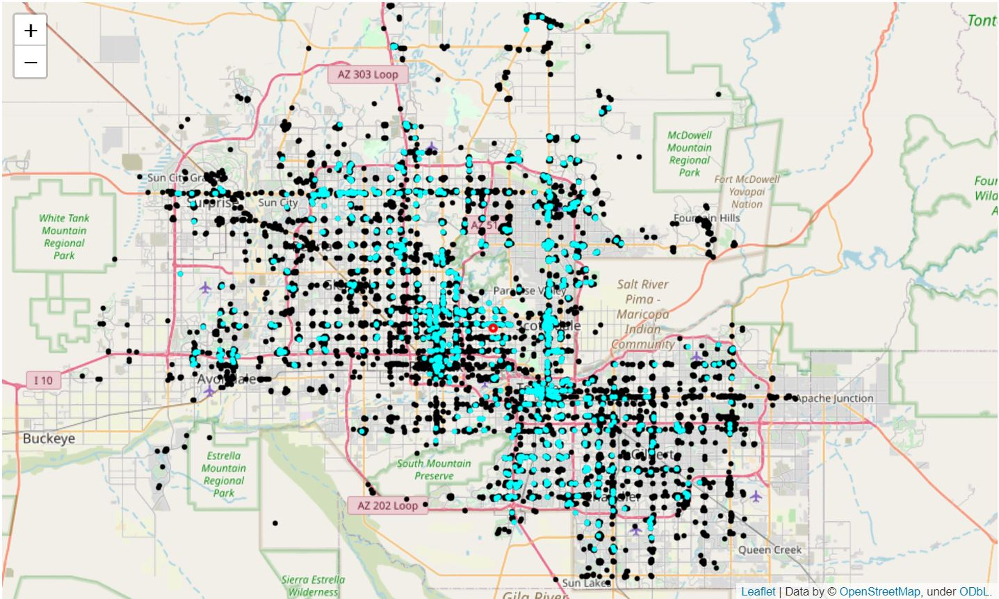

In [137]:
from IPython.display import Image
Image("C:/Users/beuzitlouis/Documents/DTU/Cours/Second semester/Advanced Business Analytics/Final project/Yelp/Phoenix/MapPhoenix1.JPG")

The following map is a heat map of the restaurants where our target users have been.

In [87]:
# Phoenix location
lat_Phoenix = 33.4483771
lon_Phoenix = -112.0740373

map_Phoenix = folium.Map([lat_Phoenix, lon_Phoenix], zoom_start=10)


for index, row in List_restaurants2.iterrows():
    folium.CircleMarker([row['latitude'], row['longitude']],
                        radius=row['frequency'],
                        fill_color="#3db7e4", # divvy color
                       ).add_to(map_Phoenix)
    
# convert to (n, 2) nd-array format for heatmap
matrix = List_restaurants2[['latitude', 'longitude']].as_matrix()

# plot heatmap
map_Phoenix.add_children(plugins.HeatMap(matrix, radius=15))
map_Phoenix



C:\Users\beuzitlouis\Nouveau dossier\lib\site-packages\ipykernel_launcher.py:15: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  from ipykernel import kernelapp as app
C:\Users\beuzitlouis\Nouveau dossier\lib\site-packages\ipykernel_launcher.py:18: FutureWarning: Method `add_children` is deprecated. Please use `add_child` instead.


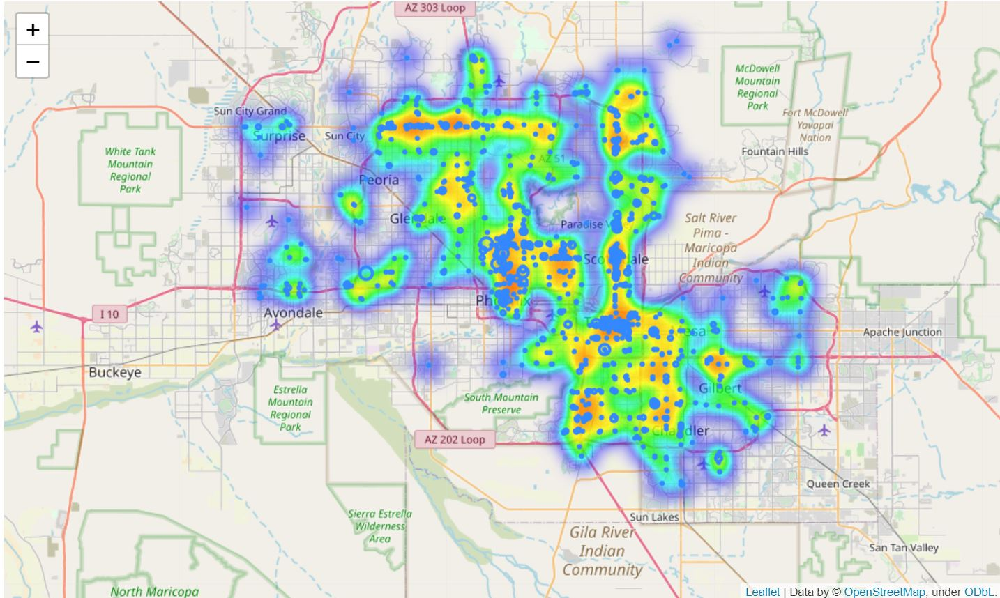

In [138]:
Image("C:/Users/beuzitlouis/Documents/DTU/Cours/Second semester/Advanced Business Analytics/Final project/Yelp/Phoenix/MapPhoenix2.JPG")

# Study of the main competitors in Phoenix

In [90]:
List_restaurants2.head(10)

,business_id,Number of reviews,frequency,latitude,longitude
0,JzOp695tclcNCNMuBl7oxA,2473,6,33.419578,-111.915885
1,85o8XAZDoPmRqHFhdJLAGg,343,6,33.478016,-112.254559
2,gQMAcDm8kv8ev7x2BshMwg,944,6,33.510181,-112.096168
3,cTJjTKz2huGZ-ElScC2pSw,1280,5,33.513575,-112.073381
4,PhMfnMldVKXo7HqHw6DSrg,372,5,33.394818,-111.940576
5,U1ZVgF-kfkvv_rcoe0RglQ,313,5,33.488760,-112.082402
6,thLX_k20SPJ0KyusGTBIHw,1485,5,33.499386,-111.926570
7,OgJ0KxwJcJ9R5bUK0ixCbg,2284,5,33.500597,-112.074237
8,eS29S_06lvsDW04wVrIVxg,1570,5,33.479016,-112.047963
9,46yg8fJ8fVA1QSaaL7XfOw,361,4,33.527475,-111.924553


In [93]:
competitor1=restaurants_Phoenix[restaurants_Phoenix['business_id']=='JzOp695tclcNCNMuBl7oxA']

In [94]:
competitor1.head()

,address,attributes,business_id,categories,city,hours,is_open,latitude,longitude,name,postal_code,review_count,stars,state,metropolis,distance metropolis
5430,1340 E 8th St,"{'RestaurantsAttire': ""'casual'"", 'BikeParking...",JzOp695tclcNCNMuBl7oxA,"Specialty Food, Pubs, American (New), Nightlif...",Tempe,"{'Monday': '0:0-0:0', 'Tuesday': '11:0-0:0', '...",1,33.419578,-111.915885,Four Peaks Brewing,85281,2400,4.5,AZ,Phoenix,18.957836


In [95]:
Four_Peaks_Brewing=restaurants_Phoenix[restaurants_Phoenix['name']=='Four Peaks Brewing']

In [96]:
Four_Peaks_Brewing.head()

,address,attributes,business_id,categories,city,hours,is_open,latitude,longitude,name,postal_code,review_count,stars,state,metropolis,distance metropolis
5430,1340 E 8th St,"{'RestaurantsAttire': ""'casual'"", 'BikeParking...",JzOp695tclcNCNMuBl7oxA,"Specialty Food, Pubs, American (New), Nightlif...",Tempe,"{'Monday': '0:0-0:0', 'Tuesday': '11:0-0:0', '...",1,33.419578,-111.915885,Four Peaks Brewing,85281,2400,4.5,AZ,Phoenix,18.957836


In [ ]:
This first competitor only has one restaurant in Phoenix

In [98]:
competitor2=restaurants_Phoenix[restaurants_Phoenix['business_id']=='85o8XAZDoPmRqHFhdJLAGg']
competitor2.head()

,address,attributes,business_id,categories,city,hours,is_open,latitude,longitude,name,postal_code,review_count,stars,state,metropolis,distance metropolis
8337,2755 N 91st Ave,"{'HasTV': 'True', 'GoodForKids': 'True', 'Cate...",85o8XAZDoPmRqHFhdJLAGg,"Restaurants, Vietnamese, Vegetarian, Nightlife...",Phoenix,"{'Monday': '10:0-21:0', 'Tuesday': '10:0-21:0'...",1,33.478016,-112.254559,Song Lynn,85037,332,4.5,AZ,Phoenix,0.0


In [101]:
Song_Lynn=restaurants_Phoenix[restaurants_Phoenix['name']=='Song Lynn']
Song_Lynn.head()

,address,attributes,business_id,categories,city,hours,is_open,latitude,longitude,name,postal_code,review_count,stars,state,metropolis,distance metropolis
8337,2755 N 91st Ave,"{'HasTV': 'True', 'GoodForKids': 'True', 'Cate...",85o8XAZDoPmRqHFhdJLAGg,"Restaurants, Vietnamese, Vegetarian, Nightlife...",Phoenix,"{'Monday': '10:0-21:0', 'Tuesday': '10:0-21:0'...",1,33.478016,-112.254559,Song Lynn,85037,332,4.5,AZ,Phoenix,0.0


Same for this Vietnamese restaurant, they only have one restaurant in Phoenix

In [102]:
competitor3=restaurants_Phoenix[restaurants_Phoenix['business_id']=='gQMAcDm8kv8ev7x2BshMwg']
competitor3.head()

,address,attributes,business_id,categories,city,hours,is_open,latitude,longitude,name,postal_code,review_count,stars,state,metropolis,distance metropolis
7794,1702 W Camelback Rd,"{'BikeParking': 'False', 'Alcohol': ""u'none'"",...",gQMAcDm8kv8ev7x2BshMwg,"Vietnamese, Restaurants, Soup, Sandwiches",Phoenix,"{'Monday': '8:30-20:15', 'Wednesday': '8:30-20...",1,33.510181,-112.096168,Pho Thanh,85015,898,4.0,AZ,Phoenix,0.0


In [103]:
Pho_Thanh=restaurants_Phoenix[restaurants_Phoenix['name']=='Pho Thanh']
Pho_Thanh.head()

,address,attributes,business_id,categories,city,hours,is_open,latitude,longitude,name,postal_code,review_count,stars,state,metropolis,distance metropolis
7794,1702 W Camelback Rd,"{'BikeParking': 'False', 'Alcohol': ""u'none'"",...",gQMAcDm8kv8ev7x2BshMwg,"Vietnamese, Restaurants, Soup, Sandwiches",Phoenix,"{'Monday': '8:30-20:15', 'Wednesday': '8:30-20...",1,33.510181,-112.096168,Pho Thanh,85015,898,4.0,AZ,Phoenix,0.0


Same for Pho Thanh

Let's now only consider the Vietname restaurants in Phoenix that have more than 4 stars and that are inside the list of restaurants visited by our target users. These restaurants are the main Competitors of Banh Mi Boys.

In [124]:
Vietnamese_Phoenix=restaurants_Phoenix[restaurants_Phoenix['categories'].str.contains('Vietnamese')]

In [127]:
Vietnamese_Phoenix2=Vietnamese_Phoenix[Vietnamese_Phoenix['stars']>3.5]

In [129]:
Main_competitors=Vietnamese_Phoenix2[Vietnamese_Phoenix2['business_id'].isin(List_business_id2)]

In [131]:
Main_competitors.head()

,address,attributes,business_id,categories,city,hours,is_open,latitude,longitude,name,postal_code,review_count,stars,state,metropolis,distance metropolis
149,"2765 N Scottsdale Rd, Ste 107","{'WiFi': ""u'no'"", 'NoiseLevel': ""u'average'"", ...",AMN3Sgns9tB2x-b3eWk0qQ,"Vietnamese, Restaurants",Scottsdale,"{'Monday': '0:0-0:0', 'Tuesday': '11:0-20:30',...",1,33.479367,-111.924723,Noodles Ranch,85257,493,4.0,AZ,Phoenix,14.814670
1136,"7901 E Thomas Rd, Ste 108","{'BusinessAcceptsCreditCards': 'True', 'Busine...",ePt0qmZgU-fjqMoM1M2U3Q,"Asian Fusion, Vietnamese, Restaurants, Thai",Scottsdale,"{'Tuesday': '11:0-21:0', 'Wednesday': '11:0-21...",1,33.479491,-111.910723,Tottie's Asian Fusion,85251,405,4.0,AZ,Phoenix,14.814670
1224,"9619 N Hayden Rd, Ste 106","{'BusinessAcceptsCreditCards': 'True', 'Outdoo...",6_kSCuQP5U4W8SfD8VVNZA,"Greek, Hot Dogs, Middle Eastern, Restaurants, ...",Scottsdale,"{'Monday': '0:0-0:0', 'Tuesday': '10:30-20:0',...",1,33.574168,-111.904832,Shish Kabobs & Gyros,85258,161,4.5,AZ,Phoenix,14.814670
1376,6149 N Scottsdale Rd,"{'RestaurantsTakeOut': 'True', 'Caters': 'True...",46yg8fJ8fVA1QSaaL7XfOw,"Vietnamese, Food, Asian Fusion, Restaurants",Scottsdale,"{'Monday': '0:0-0:0', 'Tuesday': '11:0-21:0', ...",1,33.527475,-111.924553,Slanted Rice Vietnamese Bistro,85250,347,4.0,AZ,Phoenix,14.814670
1699,"1734 East Main St, Ste 5","{'HasTV': 'True', 'RestaurantsGoodForGroups': ...",zP05w3gjD30Gi9-SCIy2DA,"Restaurants, Pan Asian, Vietnamese, Soup, Chin...",Mesa,"{'Monday': '0:0-0:0', 'Wednesday': '11:0-21:0'...",1,33.415712,-111.793541,Pho Leo,85203,277,4.5,AZ,Phoenix,29.204111


This map will show where the main competitors of Banh Mi Boys are:

In [135]:
# Phoenix location
lat_Phoenix = 33.4483771
lon_Phoenix = -112.0740373

m_Phoenix = folium.Map([lat_Phoenix, lon_Phoenix], zoom_start=10)

for index, row in Main_competitors.iterrows():
    folium.CircleMarker([row['latitude'], row['longitude']],
                        radius=5,
                        fill_color="#3db7e4", # divvy color
                       ).add_to(m_Phoenix)
    
# convert to (n, 2) nd-array format for heatmap
matrix = Main_competitors[['latitude', 'longitude']].as_matrix()

# plot heatmap
m_Phoenix.add_children(plugins.HeatMap(matrix, radius=15))


    
m_Phoenix

C:\Users\beuzitlouis\Nouveau dossier\lib\site-packages\ipykernel_launcher.py:14: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
C:\Users\beuzitlouis\Nouveau dossier\lib\site-packages\ipykernel_launcher.py:17: FutureWarning: Method `add_children` is deprecated. Please use `add_child` instead.


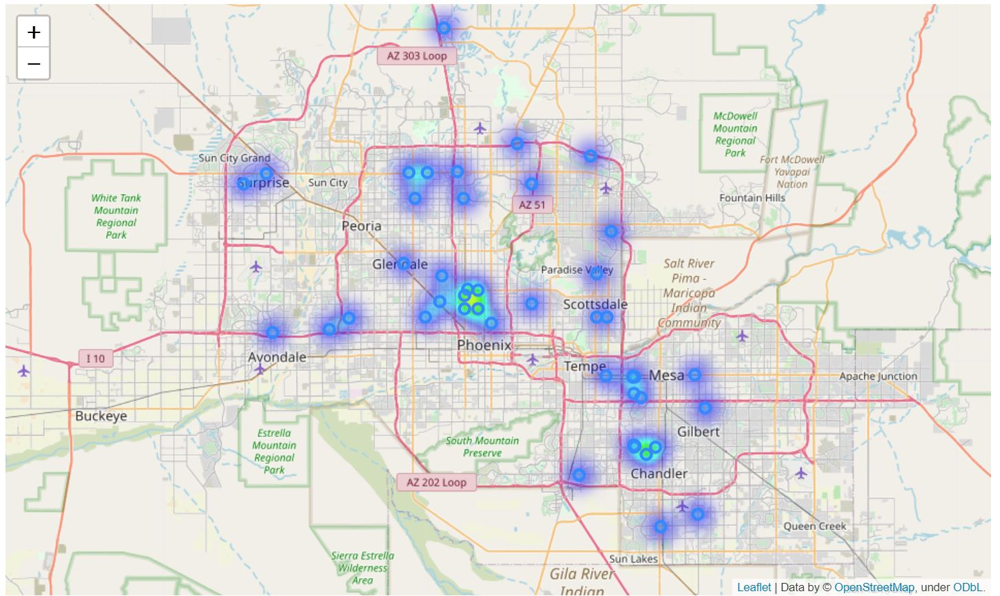

In [139]:
Image("C:/Users/beuzitlouis/Documents/DTU/Cours/Second semester/Advanced Business Analytics/Final project/Yelp/Phoenix/MapPhoenix3.JPG")

As we can see, the competitors are less present in the three areas where the demand for restaurants is really high. Near Scottsdale, Phoenix and Tempe.